In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

## Loading the dataset

In [37]:
df=pd.read_csv("House_Rent_Dataset.csv")

In [38]:
df.head()

,Posted On,BHK,Rent,Size,Floor,Area Type,Area Locality,City,Furnishing Status,Tenant Preferred,Bathroom,Point of Contact
0,2022-05-18,2,10000,1100,Ground out of 2,Super Area,Bandel,Kolkata,Unfurnished,Bachelors/Family,2,Contact Owner
1,2022-05-13,2,20000,800,1 out of 3,Super Area,"Phool Bagan, Kankurgachi",Kolkata,Semi-Furnished,Bachelors/Family,1,Contact Owner
2,2022-05-16,2,17000,1000,1 out of 3,Super Area,Salt Lake City Sector 2,Kolkata,Semi-Furnished,Bachelors/Family,1,Contact Owner
3,2022-07-04,2,10000,800,1 out of 2,Super Area,Dumdum Park,Kolkata,Unfurnished,Bachelors/Family,1,Contact Owner
4,2022-05-09,2,7500,850,1 out of 2,Carpet Area,South Dum Dum,Kolkata,Unfurnished,Bachelors,1,Contact Owner


In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4746 entries, 0 to 4745
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Posted On          4746 non-null   object
 1   BHK                4746 non-null   int64 
 2   Rent               4746 non-null   int64 
 3   Size               4746 non-null   int64 
 4   Floor              4746 non-null   object
 5   Area Type          4746 non-null   object
 6   Area Locality      4746 non-null   object
 7   City               4746 non-null   object
 8   Furnishing Status  4746 non-null   object
 9   Tenant Preferred   4746 non-null   object
 10  Bathroom           4746 non-null   int64 
 11  Point of Contact   4746 non-null   object
dtypes: int64(4), object(8)
memory usage: 445.1+ KB


In [40]:
#Data seems to be already cleaned

In [41]:
# Data Pre Processing:
#     1. Conversion into Numerical form 
#     2. Target column: Rent
#     3. Visualizations
#     4. Some need Numerical Ranking, others dont

## Cateogrical Columns Interpretation

In [42]:
df['City'].value_counts()

City
Mumbai       972
Chennai      891
Bangalore    886
Hyderabad    868
Delhi        605
Kolkata      524
Name: count, dtype: int64

In [43]:
df["Tenant Preferred"].value_counts()

Tenant Preferred
Bachelors/Family    3444
Bachelors            830
Family               472
Name: count, dtype: int64

In [44]:
df["Floor"].value_counts() #Exceptions are there

Floor
1 out of 2         379
Ground out of 2    350
2 out of 3         312
2 out of 4         308
1 out of 3         293
                  ... 
11 out of 31         1
50 out of 75         1
18 out of 26         1
12 out of 27         1
23 out of 34         1
Name: count, Length: 480, dtype: int64

In [45]:
df["Area Type"].value_counts()
#Super Area= Built area + Common Area
#Carpet Area= usable Area->Distance b/w inner walls
#Built Area=Carpet Area+width of walls(interior-exterior)

Area Type
Super Area     2446
Carpet Area    2298
Built Area        2
Name: count, dtype: int64

In [46]:
# len(df["Area Locality"].value_counts())
# ar={}
# # for x in range(len(df.index)):
# #     if df["Area"][x]=="Kolkata": #Different places
# for value in df["Area Locality"]:
#         if value in ar:
#             ar[value] += 1
#         else:
#             ar[value] = 1
            
# ar

df["Area Locality"].value_counts()

            

Area Locality
Bandra West                                37
Gachibowli                                 29
Electronic City                            24
Velachery                                  22
Miyapur, NH 9                              22
                                           ..
Kengeri Upanagara                           1
Ittamadu, Banashankari, Outer Ring Road     1
Rmv Extension, Armane Nagar                 1
snv la                                      1
Manikonda, Hyderabad                        1
Name: count, Length: 2235, dtype: int64

In [47]:
df["Furnishing Status"].value_counts()

Furnishing Status
Semi-Furnished    2251
Unfurnished       1815
Furnished          680
Name: count, dtype: int64

## Numerical Columns Interpretations

In [48]:
df.describe() #Numerical values

,BHK,Rent,Size,Bathroom
count,4746.000000,4.746000e+03,4746.000000,4746.000000
mean,2.083860,3.499345e+04,967.490729,1.965866
std,0.832256,7.810641e+04,634.202328,0.884532
min,1.000000,1.200000e+03,10.000000,1.000000
25%,2.000000,1.000000e+04,550.000000,1.000000
50%,2.000000,1.600000e+04,850.000000,2.000000
75%,3.000000,3.300000e+04,1200.000000,2.000000
max,6.000000,3.500000e+06,8000.000000,10.000000


In [49]:
#can create a new column that tells how high status a location is

## Data Visualization

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns

In [52]:
df

,Posted On,BHK,Rent,Size,Floor,Area Type,Area Locality,City,Furnishing Status,Tenant Preferred,Bathroom,Point of Contact
0,2022-05-18,2,10000,1100,Ground out of 2,Super Area,Bandel,Kolkata,Unfurnished,Bachelors/Family,2,Contact Owner
1,2022-05-13,2,20000,800,1 out of 3,Super Area,"Phool Bagan, Kankurgachi",Kolkata,Semi-Furnished,Bachelors/Family,1,Contact Owner
2,2022-05-16,2,17000,1000,1 out of 3,Super Area,Salt Lake City Sector 2,Kolkata,Semi-Furnished,Bachelors/Family,1,Contact Owner
3,2022-07-04,2,10000,800,1 out of 2,Super Area,Dumdum Park,Kolkata,Unfurnished,Bachelors/Family,1,Contact Owner
4,2022-05-09,2,7500,850,1 out of 2,Carpet Area,South Dum Dum,Kolkata,Unfurnished,Bachelors,1,Contact Owner
...,...,...,...,...,...,...,...,...,...,...,...,...
4741,2022-05-18,2,15000,1000,3 out of 5,Carpet Area,Bandam Kommu,Hyderabad,Semi-Furnished,Bachelors/Family,2,Contact Owner
4742,2022-05-15,3,29000,2000,1 out of 4,Super Area,"Manikonda, Hyderabad",Hyderabad,Semi-Furnished,Bachelors/Family,3,Contact Owner
4743,2022-07-10,3,35000,1750,3 out of 5,Carpet Area,"Himayath Nagar, NH 7",Hyderabad,Semi-Furnished,Bachelors/Family,3,Contact Agent
4744,2022-07-06,3,45000,1500,23 out of 34,Carpet Area,Gachibowli,Hyderabad,Semi-Furnished,Family,2,Contact Agent


array([[<Axes: title={'center': 'BHK'}>,
        <Axes: title={'center': 'Rent'}>],
       [<Axes: title={'center': 'Size'}>,
        <Axes: title={'center': 'Bathroom'}>]], dtype=object)

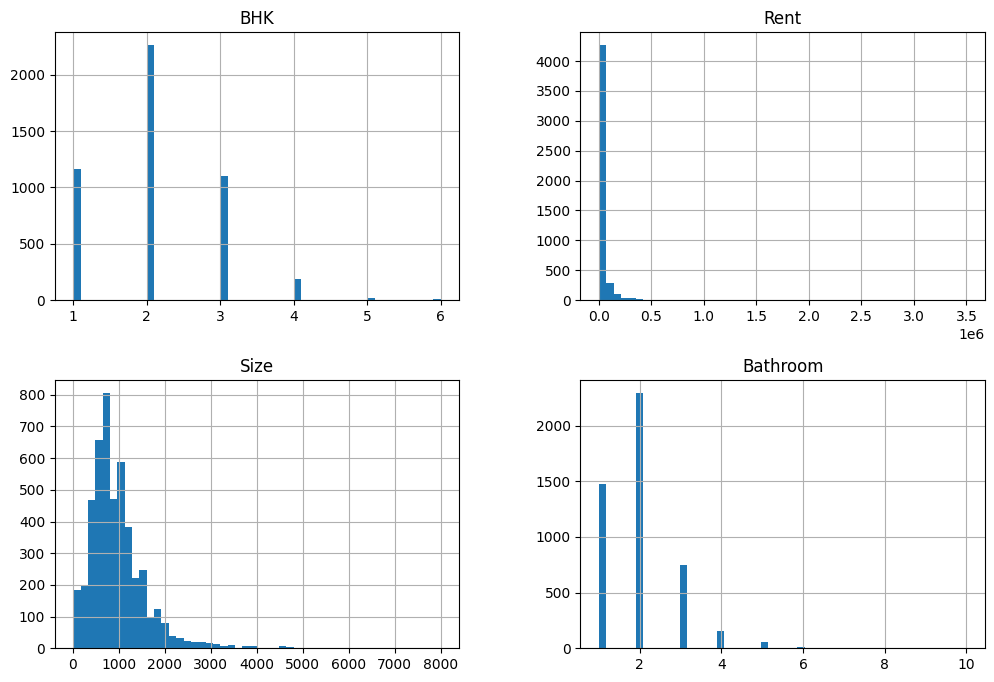

In [53]:
df.hist(bins=50,figsize=(12,8))

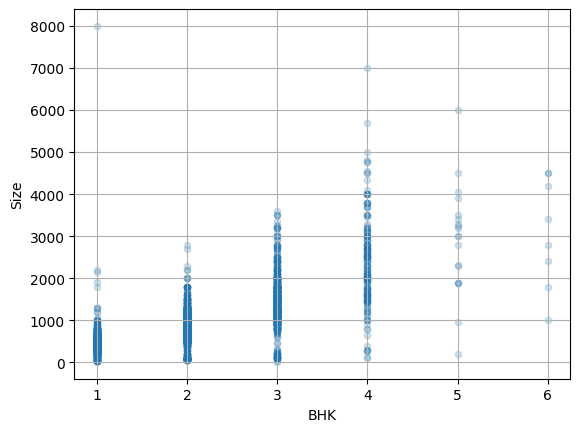

In [54]:
df.plot(kind="scatter",x="BHK",y="Size",grid=True,alpha=0.2)
plt.show()

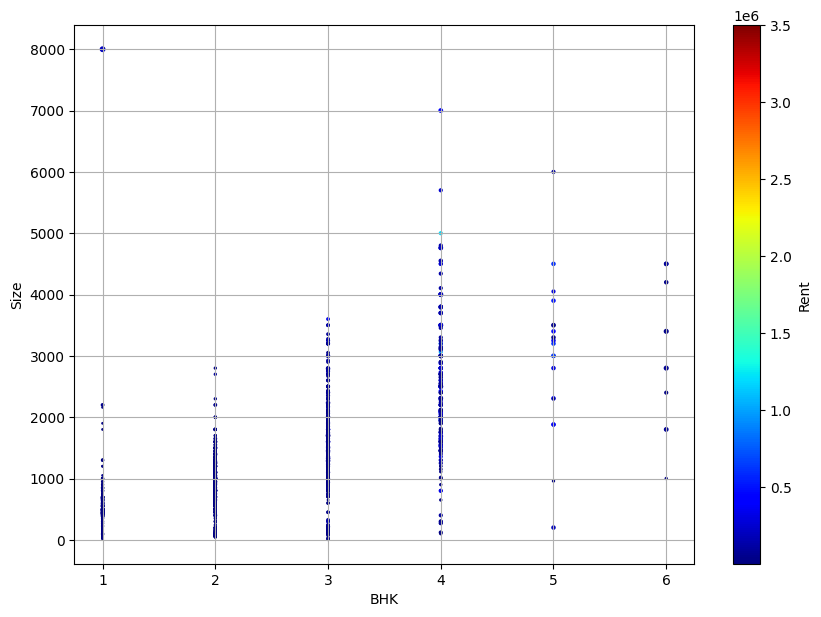

In [55]:
df.plot(kind="scatter",x="BHK",y="Size",grid=True,s=df["Bathroom"],
        c="Rent",cmap="jet",
        colorbar=True,legend=True,sharex=False,figsize=(10,7))
plt.show()

/tmp/ipykernel_12202/2022651152.py:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=df['City'], y=df['Rent'], hue=df['Area Type'], ci=None, palette="flare")


Text(0, 0.5, 'Rent')

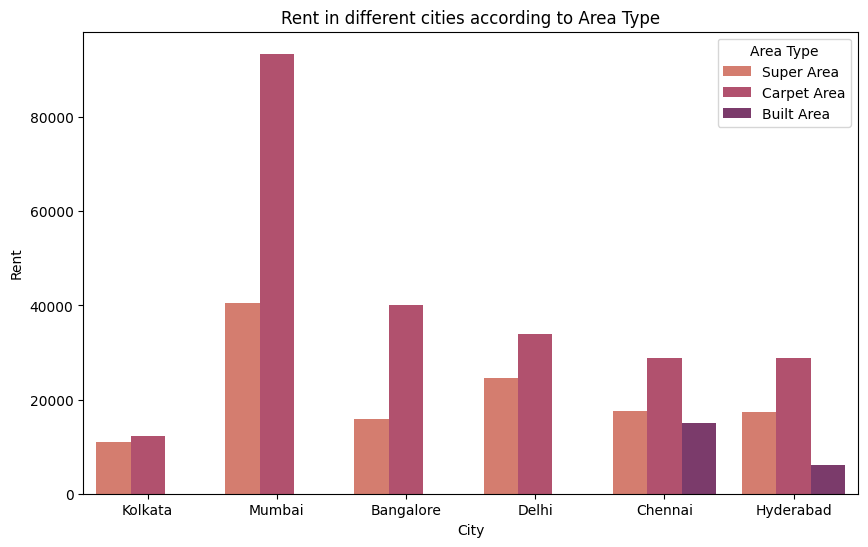

In [56]:
plt.figure(figsize=(10,6))
sns.barplot(x=df['City'], y=df['Rent'], hue=df['Area Type'], ci=None, palette="flare")
plt.title("Rent in different cities according to Area Type")
plt.ylabel("Rent")

/tmp/ipykernel_12202/1470457671.py:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=df['City'], y=df['Rent'], hue=df['Furnishing Status'], ci=None, palette="flare")


Text(0, 0.5, 'Rent')

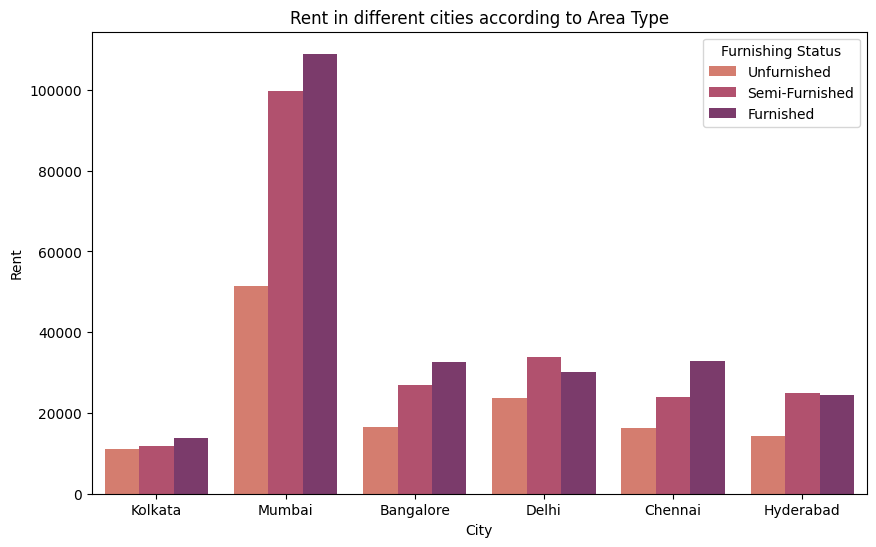

In [57]:
plt.figure(figsize=(10,6))
sns.barplot(x=df['City'], y=df['Rent'], hue=df['Furnishing Status'], ci=None, palette="flare")
plt.title("Rent in different cities according to Area Type")
plt.ylabel("Rent")

/tmp/ipykernel_12202/773350537.py:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=df['City'], y=df['Rent'], hue=df['Point of Contact'], ci=None, palette="flare")


Text(0, 0.5, 'Rent')

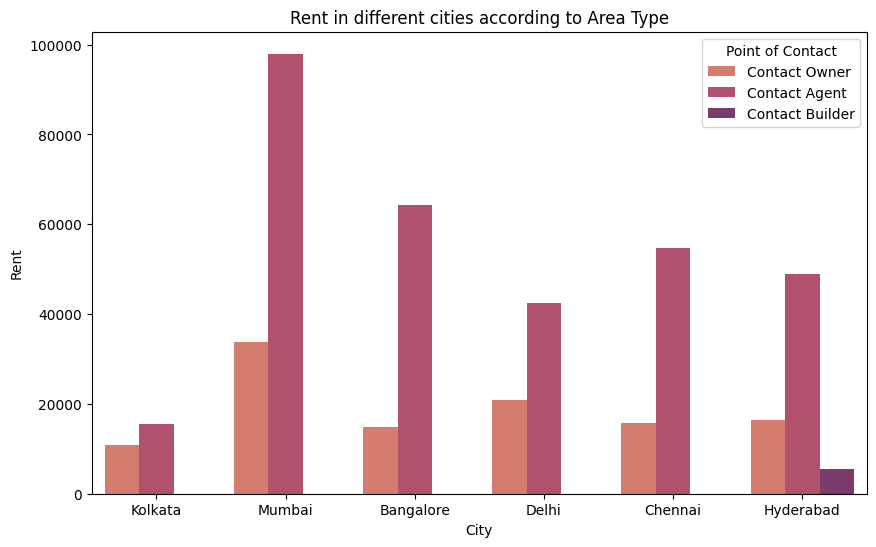

In [58]:
plt.figure(figsize=(10,6))
sns.barplot(x=df['City'], y=df['Rent'], hue=df['Point of Contact'], ci=None, palette="flare")
plt.title("Rent in different cities according to Area Type")
plt.ylabel("Rent")

/tmp/ipykernel_12202/3175401272.py:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=df['Point of Contact'], y=df['Rent'], hue=df['Area Type'], ci=None, palette="flare")


Text(0, 0.5, 'Rent')

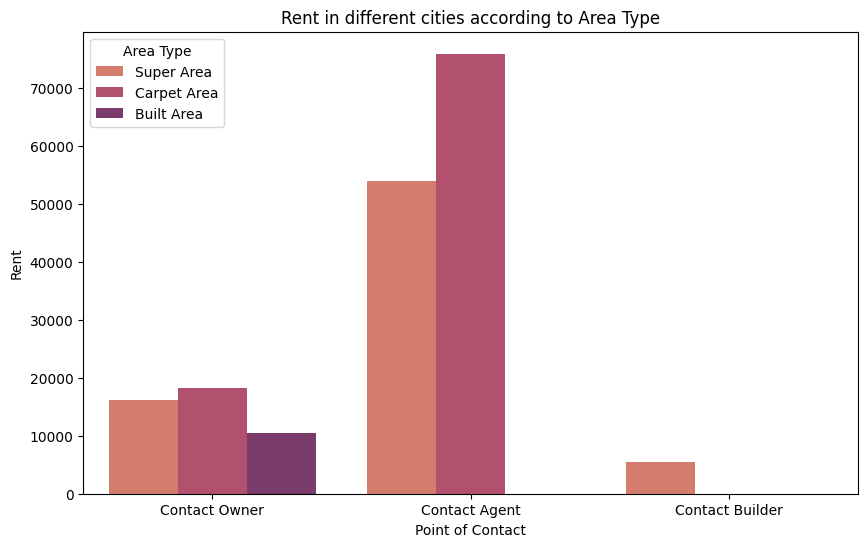

In [59]:
plt.figure(figsize=(10,6))
sns.barplot(x=df['Point of Contact'], y=df['Rent'], hue=df['Area Type'], ci=None, palette="flare")
plt.title("Rent in different cities according to Area Type")
plt.ylabel("Rent")

/tmp/ipykernel_12202/1652341750.py:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=df['Furnishing Status'], y=df['Rent'], hue=df['Area Type'], ci=None, palette="flare")


Text(0, 0.5, 'Rent')

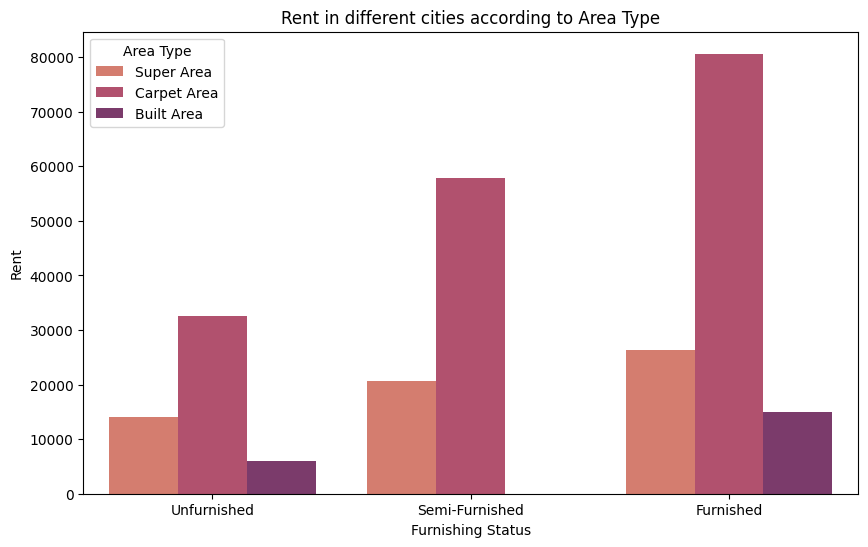

In [60]:
plt.figure(figsize=(10,6))
sns.barplot(x=df['Furnishing Status'], y=df['Rent'], hue=df['Area Type'], ci=None, palette="flare")
plt.title("Rent in different cities according to Area Type")
plt.ylabel("Rent")

In [62]:
numerical_features = [feature for feature in df.columns if df[feature].dtypes != 'O']
discrete_features = [feature for feature in numerical_features if len(df[feature].unique())<25]
continuous_features = [feature for feature in numerical_features if feature not in discrete_features]
categorical_features = [feature for feature in df.columns if feature not in numerical_features]
binary_categorical_features = [feature for feature in categorical_features if len(df[feature].unique()) <=3]
print("Numerical Features Count {}".format(len(numerical_features)))
print("Discrete features Count {}".format(len(discrete_features)))
print("Continuous features Count {}".format(len(continuous_features)))
print("Categorical features Count {}".format(len(categorical_features)))
print("Binary Categorical features Count {}".format(len(binary_categorical_features)))

Numerical Features Count 4
Discrete features Count 2
Continuous features Count 2
Categorical features Count 8
Binary Categorical features Count 4


In [63]:
outliers_features = [feature for feature in continuous_features]
print(outliers_features)

def remove_outliers(df,outliers_features):
    # create copy of dataframe
    
    data = df.copy()
    
    for feature in data[outliers_features].columns:
        Q3 = data[feature].quantile(0.75)
        Q1 = data[feature].quantile(0.25)
        IQR = Q3 - Q1
        lower_limit = round(Q1 - 1.5 * IQR)
        upper_limit = round(Q3 + 1.5 * IQR)
        data.loc[data[feature]>= upper_limit,feature] = upper_limit
        data.loc[data[feature]<=lower_limit,feature] = lower_limit
    return data

df = remove_outliers(df,outliers_features)

['Rent', 'Size']


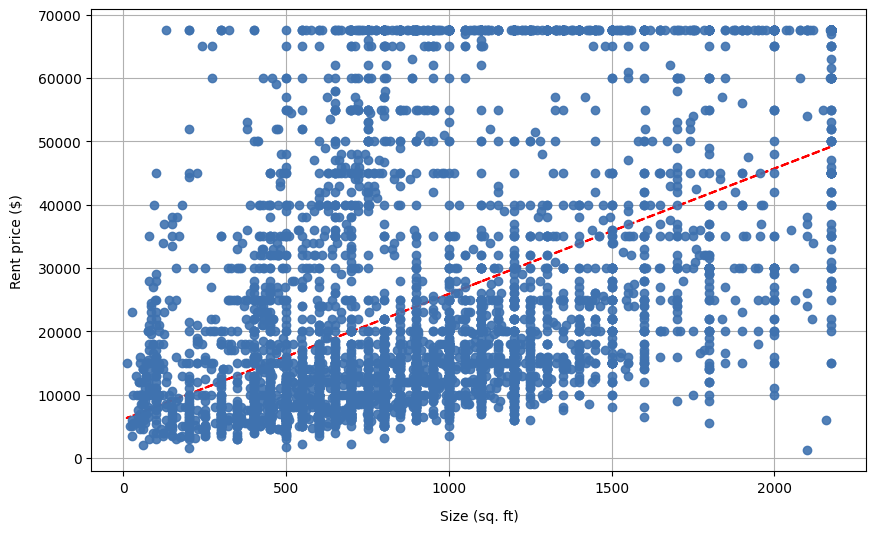

In [64]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.grid()
ax.scatter(df["Size"], df["Rent"], c="#3f72af", zorder=3, alpha=0.9)
ax.set_xlabel("Size (sq. ft)", labelpad=10)
ax.set_ylabel("Rent price ($)", labelpad=10)
z = np.polyfit(df["Size"], df["Rent"], 1)
p = np.poly1d(z)
plt.plot(df["Size"],p(df["Size"]),"r--")
plt.show()

## Conversion Categorical Columns into Numerical Columns

In [65]:
# Some Assumptions:
#     Delhi,Mumbai,Bangalore->Tech Cities->Value 1
#     Kolkata, Hyderabad, Chennai->Developing Tech Cities->2

In [66]:
# Option 1: One hot encoding (doesnt grade the location)
# Option 2: Do Ordinal Encoding (which ranks the location)

In [67]:
condition=(df.City =="Kolkata") | (df.City =="Chennai") | (df.City =="Hyderabad")
condition2=(df.City =="Bangalore") | (df.City =="Mumbai") | (df.City =="Delhi")
#Went with Option 1: Ranking cities accordint to Tech cities and developing Tech cities
df.loc[condition,"City_cat"]=2
df.loc[condition2,"City_cat"]=1

In [68]:
from sklearn.preprocessing import OneHotEncoder

In [69]:
df.head()

,Posted On,BHK,Rent,Size,Floor,Area Type,Area Locality,City,Furnishing Status,Tenant Preferred,Bathroom,Point of Contact,City_cat
0,2022-05-18,2,10000,1100,Ground out of 2,Super Area,Bandel,Kolkata,Unfurnished,Bachelors/Family,2,Contact Owner,2.0
1,2022-05-13,2,20000,800,1 out of 3,Super Area,"Phool Bagan, Kankurgachi",Kolkata,Semi-Furnished,Bachelors/Family,1,Contact Owner,2.0
2,2022-05-16,2,17000,1000,1 out of 3,Super Area,Salt Lake City Sector 2,Kolkata,Semi-Furnished,Bachelors/Family,1,Contact Owner,2.0
3,2022-07-04,2,10000,800,1 out of 2,Super Area,Dumdum Park,Kolkata,Unfurnished,Bachelors/Family,1,Contact Owner,2.0
4,2022-05-09,2,7500,850,1 out of 2,Carpet Area,South Dum Dum,Kolkata,Unfurnished,Bachelors,1,Contact Owner,2.0


In [70]:
# # df["Tenant Preferred"]
# categorical_columns=["Furnishing Status","Point of Contact","Tenant Preferred"]
# categorical_data = df[categorical_columns]

# # Create an instance of the OneHotEncoder
# encoder = OneHotEncoder()

# # Fit and transform the categorical columns using the OneHotEncoder
# encoded_data = encoder.fit_transform(categorical_data)
# encoded_data.toarray()

In [71]:
df.drop("City",axis=1,inplace=True)

In [72]:
df.drop("Area Locality",axis=1,inplace=True)

In [73]:
df.drop("Floor",axis=1,inplace=True)

In [74]:
df.drop("Posted On",axis=1,inplace=True)

In [75]:
df=pd.get_dummies(df,dtype=float)

In [76]:
df

,BHK,Rent,Size,Bathroom,City_cat,Area Type_Built Area,Area Type_Carpet Area,Area Type_Super Area,Furnishing Status_Furnished,Furnishing Status_Semi-Furnished,Furnishing Status_Unfurnished,Tenant Preferred_Bachelors,Tenant Preferred_Bachelors/Family,Tenant Preferred_Family,Point of Contact_Contact Agent,Point of Contact_Contact Builder,Point of Contact_Contact Owner
0,2,10000,1100,2,2.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
1,2,20000,800,1,2.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
2,2,17000,1000,1,2.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
3,2,10000,800,1,2.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
4,2,7500,850,1,2.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4741,2,15000,1000,2,2.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
4742,3,29000,2000,3,2.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
4743,3,35000,1750,3,2.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
4744,3,45000,1500,2,2.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0


In [77]:
# encoder.categories_

In [78]:
# encoder.handle_unknown="ignore"
# encoder.transform()

In [79]:
df_corr=df.corr() 

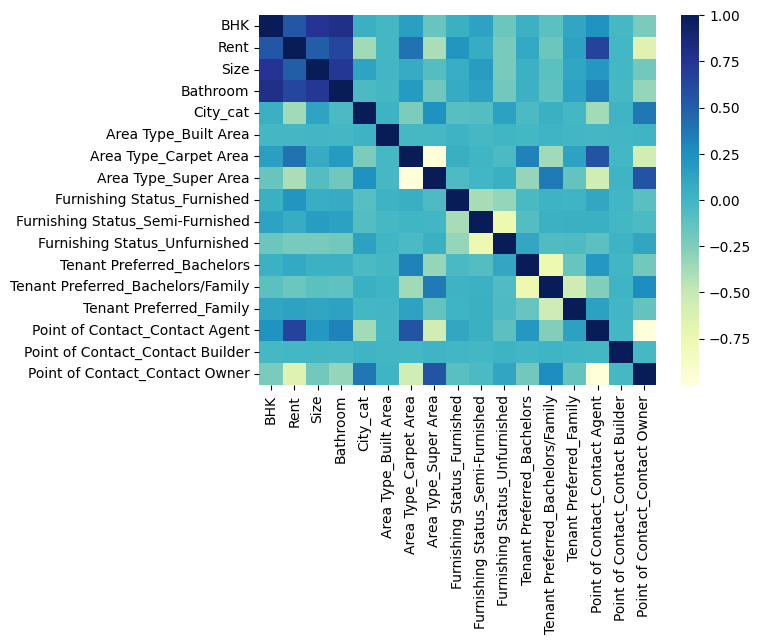

In [80]:
sns.heatmap(df_corr,cmap='YlGnBu')
plt.show()

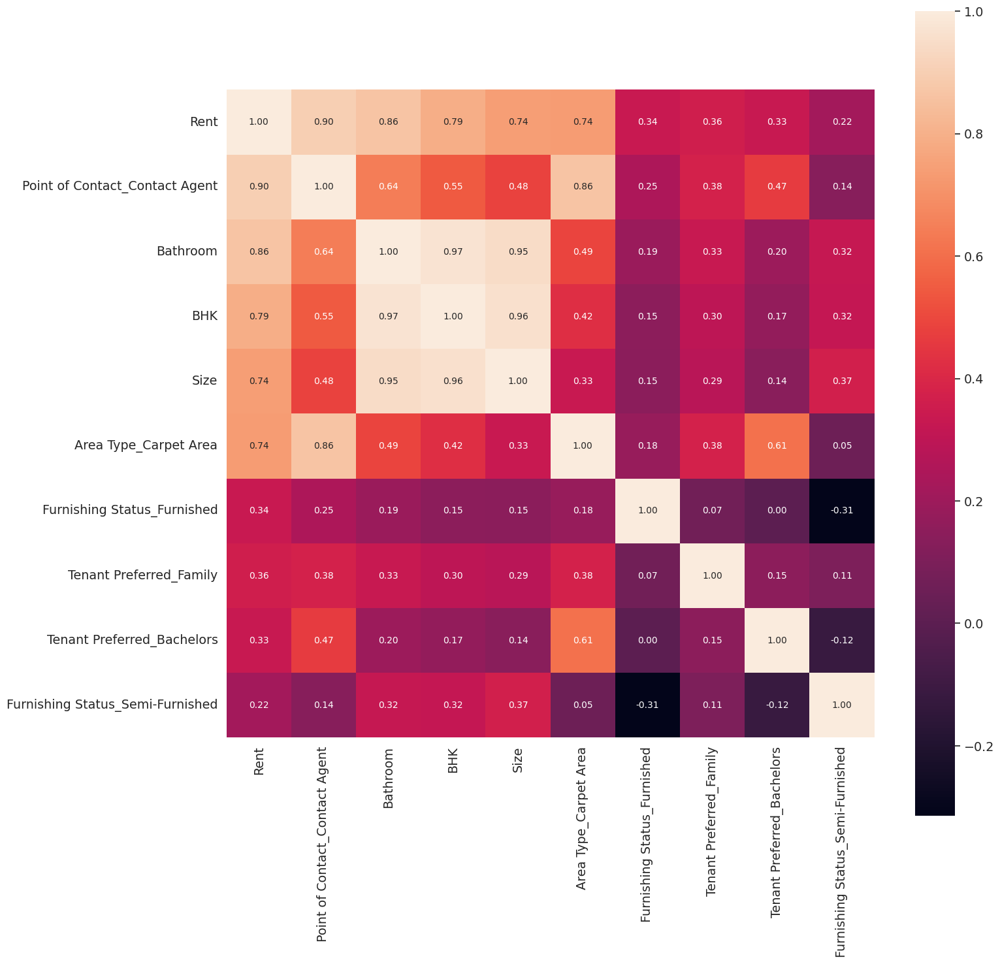

In [81]:
plt.figure(figsize=(16,16))
columns = df_corr.nlargest(10, 'Rent')['Rent'].index
correlation_matrix = np.corrcoef(df_corr[columns].values.T)
sns.set(font_scale=1.25)
heat_map = sns.heatmap(correlation_matrix, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=columns.values, xticklabels=columns.values)
plt.show()

## More Visualizations with the help of Autoviz

Imported v0.1.730. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Shape of your Data Set loaded: (4746, 17)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    16 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Since Number of Rows in data 4746 exceeds maximum, randomly sampling 4746 rows for EDA...

################ Regression problem #####################
To fix data quality issues automatically, import FixDQ from autov

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
BHK,int64,0.000000,0,1.000000,6.000000,has 23 outliers greater than upper bound (4.50) or lower than lower bound(0.50). Cap them or remove them.
Size,int64,0.000000,12,10.000000,2175.000000,No issue
Bathroom,int64,0.000000,0,1.000000,10.000000,has 179 outliers greater than upper bound (3.50) or lower than lower bound(-0.50). Cap them or remove them.
City_cat,float64,0.000000,NA,1.000000,2.000000,No issue
Area Type_Built Area,float64,0.000000,NA,0.000000,1.000000,has 2 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
Area Type_Carpet Area,float64,0.000000,NA,0.000000,1.000000,No issue
Area Type_Super Area,float64,0.000000,NA,0.000000,1.000000,has a high correlation with ['Area Type_Carpet Area']. Consider dropping one of them.
Furnishing Status_Furnished,float64,0.000000,NA,0.000000,1.000000,has 628 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
Furnishing Status_Semi-Furnished,float64,0.000000,NA,0.000000,1.000000,No issue
Furnishing Status_Unfurnished,float64,0.000000,NA,0.000000,1.000000,No issue


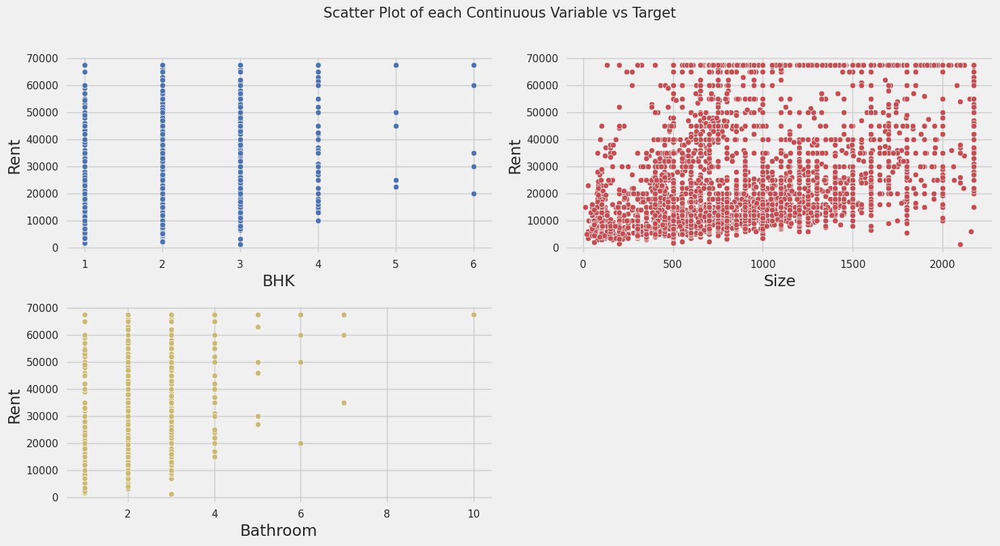

Number of All Scatter Plots = 6


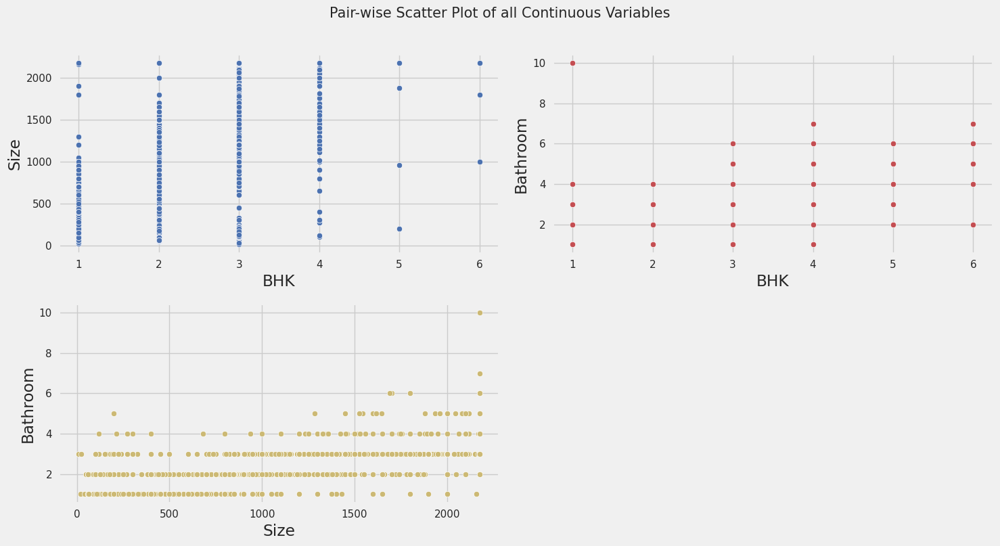

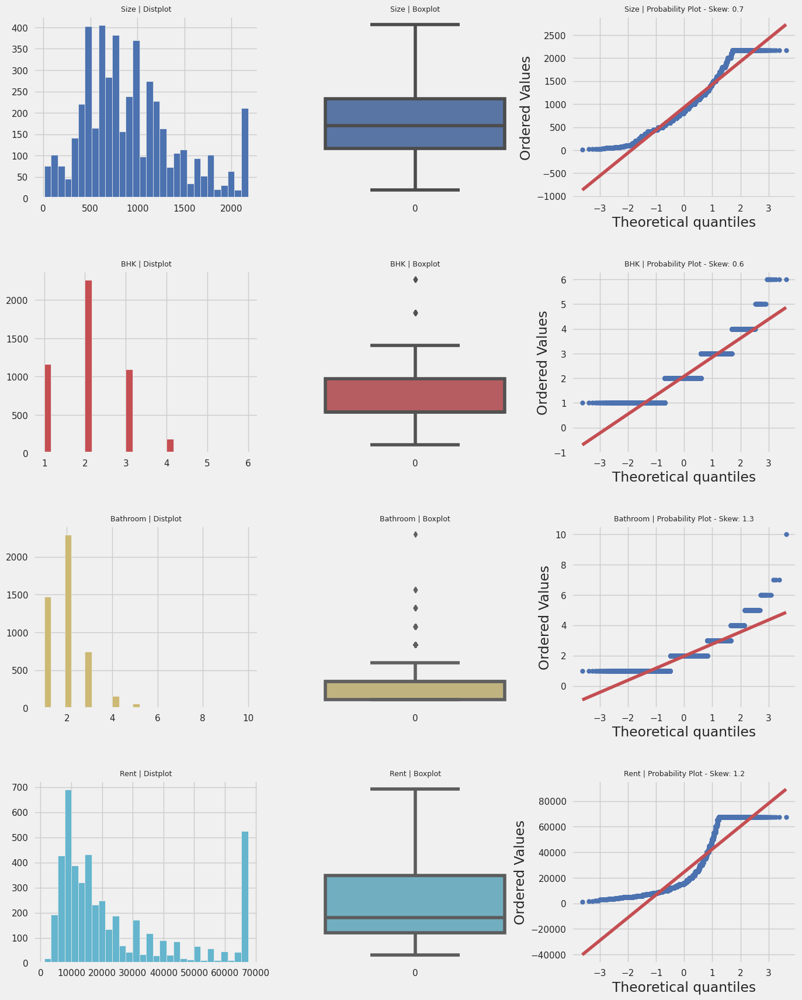

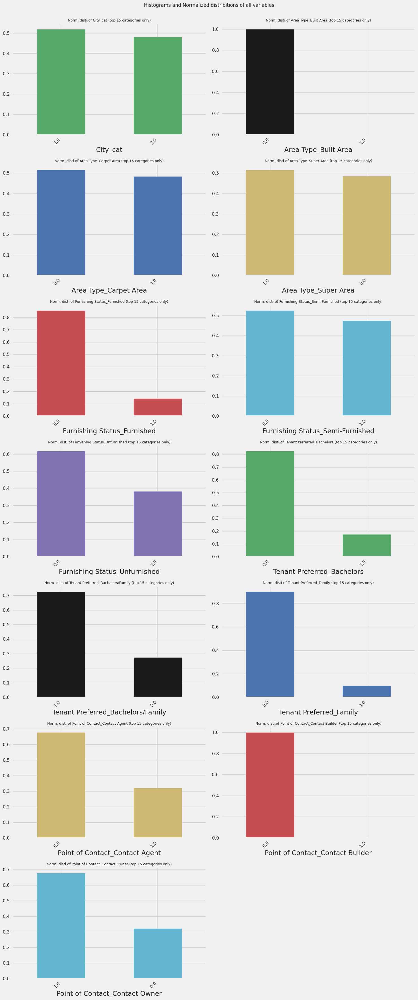

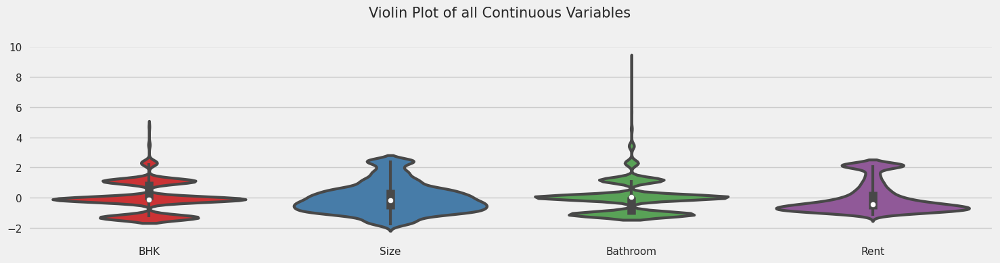

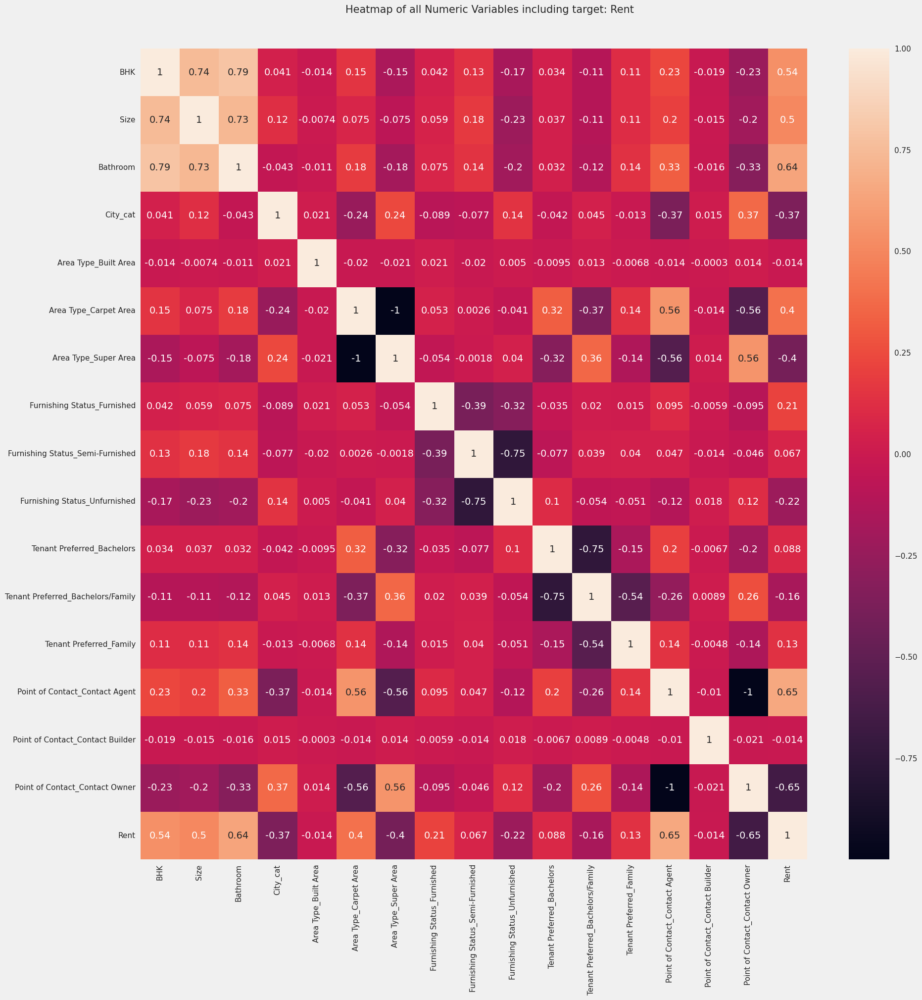

No categorical or numeric vars in data set. Hence no bar charts.
All Plots done
Time to run AutoViz = 7 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


,BHK,Size,Bathroom,City_cat,Area Type_Built Area,Area Type_Carpet Area,Area Type_Super Area,Furnishing Status_Furnished,Furnishing Status_Semi-Furnished,Furnishing Status_Unfurnished,Tenant Preferred_Bachelors,Tenant Preferred_Bachelors/Family,Tenant Preferred_Family,Point of Contact_Contact Agent,Point of Contact_Contact Builder,Point of Contact_Contact Owner,Rent
1332,1,410,1,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,50000
4345,2,1300,2,2.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,15000
4495,2,900,2,2.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,12000
2473,1,400,1,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,13000
3883,3,1798,3,2.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,48000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1033,1,280,1,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,20000
3264,3,1650,3,2.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,20000
1653,2,1100,2,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,22000
2607,2,1800,2,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,30000


In [82]:
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline
AV = AutoViz_Class()
AV.AutoViz(filename='',dfte=df,depVar='Rent',verbose=1,max_rows_analyzed=df.shape[0])

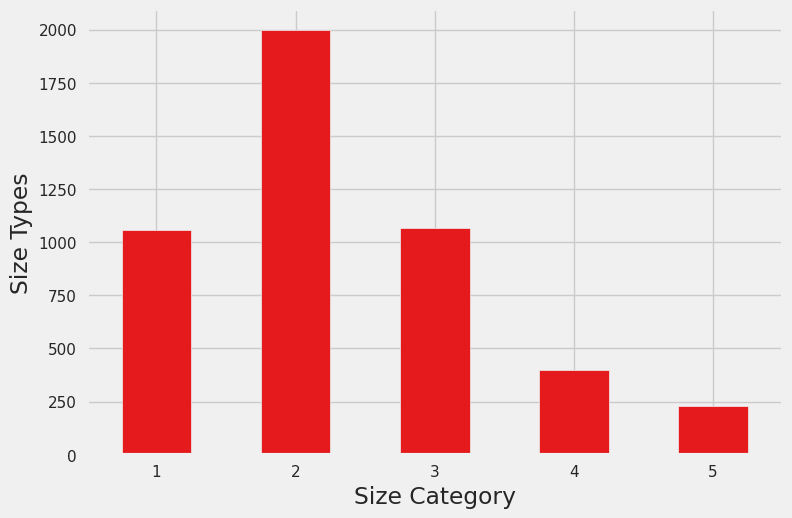

In [83]:
df["Size_cat"]=pd.cut(df["Size"],bins=[0,500,1000,1500,2000,np.inf],labels=[1,2,3,4,5])
df["Size_cat"].value_counts().sort_index().plot.bar(rot=0,grid=True)
plt.xlabel("Size Category")
plt.ylabel("Size Types")
plt.show()

In [85]:
y=df["Rent"]
x=df.drop(columns=['Rent'])

In [117]:
# from sklearn.model_selection import train_test_split
# trainX,testX,trainY,testY=train_test_split(x,y,test_size=0.2,random_state=42)
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(df, train_size=0.75, random_state=123)

## Model Training

In [119]:
# !pip install -q git+https://github.com/pycaret/pycaret.git
!pip install --upgrade pycaret

In [120]:
from pycaret.regression import *
setup_de_regressao = setup(data=train_df, target='Rent')
best_models = compare_models(n_select=5)

,Description,Value
0,Session id,1974
1,Target,Rent
2,Target type,Regression
3,Original data shape,"(3559, 18)"
4,Transformed data shape,"(3559, 22)"
5,Transformed train set shape,"(2491, 22)"
6,Transformed test set shape,"(1068, 22)"
7,Numeric features,16
8,Categorical features,1
9,Preprocess,True


,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,15:26:17
Status,. . . . . . . . . . . . . . . . . .,Fitting 10 Folds
Estimator,. . . . . . . . . . . . . . . . . .,Light Gradient Boosting Machine


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,6956.9118,104858528.8774,10202.4841,0.7265,0.4248,0.3780,0.0900
xgboost,Extreme Gradient Boosting,7038.6386,115300268.6049,10705.3532,0.6980,0.4583,0.3801,1.3980
rf,Random Forest Regressor,6998.8630,116965265.7259,10772.7372,0.6952,0.4382,0.3747,0.2010
llar,Lasso Least Angle Regression,8129.6511,120783416.0500,10963.1125,0.6862,0.6821,0.4679,0.0310
br,Bayesian Ridge,8141.1316,121118839.2156,10979.3012,0.6854,0.6897,0.4699,0.0320
lr,Linear Regression,8141.1941,121171831.2820,10981.5968,0.6853,0.6930,0.4704,0.3580
lasso,Lasso Regression,8141.4931,121167241.7578,10981.4005,0.6853,0.6931,0.4704,0.1680
ridge,Ridge Regression,8141.1345,121158308.7038,10981.0146,0.6853,0.6921,0.4703,0.0290
huber,Huber Regressor,7955.7898,124820526.3099,11138.8962,0.6769,0.5487,0.4248,0.0530
et,Extra Trees Regressor,7363.6772,137446062.0257,11698.4757,0.6379,0.4693,0.3936,0.1840


Processing:   0%|          | 0/85 [00:00<?, ?it/s]


KeyboardInterrupt



In [121]:
best_models[0]

NameError: name 'best_models' is not defined

In [ ]:
cat_tunado = tune_model(best_models[0])

In [ ]:
predictions = predict_model(model_final, test_df)
predictions

In [90]:
# from sklearn.linear_model import LinearRegression
# model=LinearRegression()
# model.fit(trainX,trainY)
# model.score(testX,testY)

0.7214903340939224

In [92]:
# from sklearn.model_selection import ShuffleSplit
# from sklearn.model_selection import cross_val_score

# cv=ShuffleSplit(n_splits=5,test_size=0.2,random_state=42)

# cross_val_score(LinearRegression(),x,y,cv=cv)

array([0.72149033, 0.71300371, 0.70904297, 0.66861913, 0.68583159])

In [94]:
# from sklearn.model_selection import GridSearchCV
# from sklearn.linear_model import Lasso
# from sklearn.tree import DecisionTreeRegressor

In [97]:
# def bestmodel_usingGridSearch(x,y):
#     algos={
#         'linear Regression':{
#             'model':LinearRegression(),
#             'params':{
#                 'normalize':{True,False}
#             }
#         },
#         'lasso':{
#             'model':Lasso(),
#             'params':{
#                 'aplha':[1,2],
#                 'selection':['random','cyclic']
#             }
#         },
#         'decision_tree':{
#             'model':DecisionTreeRegressor(),
#             'params':{
#                 'criterion':['mse','friedman_mse'],
#                 'splitter':['best','random']
#             }
#         }
#     }
#     scores=[]
#     cv=ShuffleSplit(n_splits=5,test_size=0.2,random_state=42)
#     for algo_name,conf in algos.items():
#         gs=GridSearchCV(conf['model'],conf['params'],cv=cv,return_train_score=False)
#         gs.fit(x,y)
#         scores.append[{
#             'model':algo_name,
#             'best_score':gs.best_score_,
#             'best_param':gs.best_params_
#         }]
#         return pd.DataFrame(scsores,columns=['model','best_score','best_params'])

In [100]:
# bestmodel_usingGridSearch(x,y)

In [109]:
# x.columns

Index(['BHK', 'Size', 'Bathroom', 'City_cat', 'Area Type_Built Area',
       'Area Type_Carpet Area', 'Area Type_Super Area',
       'Furnishing Status_Furnished', 'Furnishing Status_Semi-Furnished',
       'Furnishing Status_Unfurnished', 'Tenant Preferred_Bachelors',
       'Tenant Preferred_Bachelors/Family', 'Tenant Preferred_Family',
       'Point of Contact_Contact Agent', 'Point of Contact_Contact Builder',
       'Point of Contact_Contact Owner', 'Size_cat'],
      dtype='object')

In [111]:
# def predict_price(city,bhk,size,bathroom):
#     loc_index=np.where(x.columns==city)[0][0]
#     x=np.zerpes(len(x.columns))
#     x[0]=bhk
#     x[1]=size
#     x[2]=bathroom

In [116]:
# np.where(x.columns=='City_cat')[0][0]

3